# **1. Perkenalan Dataset**


Tahap pertama, Anda harus mencari dan menggunakan dataset **tanpa label** dengan ketentuan sebagai berikut:

1. **Sumber Dataset**:  
   Dataset dapat diperoleh dari berbagai sumber, seperti public repositories (*Kaggle*, *UCI ML Repository*, *Open Data*) atau data primer yang Anda kumpulkan sendiri.
   
2. **Ketentuan Dataset**:
   - **Tanpa label**: Dataset tidak boleh memiliki label atau kelas.
   - **Jumlah Baris**: Minimal 1000 baris untuk memastikan dataset cukup besar untuk analisis yang bermakna.
   - **Tipe Data**: Harus mengandung data **kategorikal** dan **numerikal**.
     - *Kategorikal*: Misalnya jenis kelamin, kategori produk.
     - *Numerikal*: Misalnya usia, pendapatan, harga.

3. **Pembatasan**:  
   Dataset yang sudah digunakan dalam latihan clustering (seperti customer segmentation) tidak boleh digunakan.

# **2. Import Library**

Pada tahap ini, Anda perlu mengimpor beberapa pustaka (library) Python yang dibutuhkan untuk analisis data dan pembangunan model machine learning.

In [1]:
# Installing packages
!pip install numpy
!pip install pandas
!pip install matplotlib
!pip install seaborn
!pip install scikit-learn

Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable


In [2]:
#Type your code here
# Import library yang diperlukan untuk analisis clustering
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler, StandardScaler, RobustScaler, PowerTransformer, QuantileTransformer, LabelEncoder
from sklearn.preprocessing import OrdinalEncoder, OneHotEncoder
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.decomposition import PCA, FastICA, NMF, KernelPCA
from sklearn.feature_selection import SelectKBest, mutual_info_classif, f_classif
from sklearn.manifold import TSNE, MDS, Isomap
from sklearn.pipeline import Pipeline
from scipy.stats import pearsonr
from itertools import combinations
from scipy.stats import zscore
from yellowbrick.cluster import KElbowVisualizer
from sklearn.metrics import silhouette_samples

# **3. Memuat Dataset**

Pada tahap ini, Anda perlu memuat dataset ke dalam notebook. Jika dataset dalam format CSV, Anda bisa menggunakan pustaka pandas untuk membacanya. Pastikan untuk mengecek beberapa baris awal dataset untuk memahami strukturnya dan memastikan data telah dimuat dengan benar.

Jika dataset berada di Google Drive, pastikan Anda menghubungkan Google Drive ke Colab terlebih dahulu. Setelah dataset berhasil dimuat, langkah berikutnya adalah memeriksa kesesuaian data dan siap untuk dianalisis lebih lanjut.

In [3]:
#Type your code here
# Load dataset
file_path = "Dataset_inisiasi.csv"
df = pd.read_csv(file_path)

# Tampilkan informasi dataset
print(df.info())
print(df.head())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2512 entries, 0 to 2511
Data columns (total 16 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   TransactionID            2512 non-null   object 
 1   AccountID                2512 non-null   object 
 2   TransactionAmount        2512 non-null   float64
 3   TransactionDate          2512 non-null   object 
 4   TransactionType          2512 non-null   object 
 5   Location                 2512 non-null   object 
 6   DeviceID                 2512 non-null   object 
 7   IP Address               2512 non-null   object 
 8   MerchantID               2512 non-null   object 
 9   Channel                  2512 non-null   object 
 10  CustomerAge              2512 non-null   int64  
 11  CustomerOccupation       2512 non-null   object 
 12  TransactionDuration      2512 non-null   int64  
 13  LoginAttempts            2512 non-null   int64  
 14  AccountBalance          

# **4. Exploratory Data Analysis (EDA)**

Pada tahap ini, Anda akan melakukan **Exploratory Data Analysis (EDA)** untuk memahami karakteristik dataset. EDA bertujuan untuk:

1. **Memahami Struktur Data**
   - Tinjau jumlah baris dan kolom dalam dataset.  
   - Tinjau jenis data di setiap kolom (numerikal atau kategorikal).

2. **Menangani Data yang Hilang**  
   - Identifikasi dan analisis data yang hilang (*missing values*). Tentukan langkah-langkah yang diperlukan untuk menangani data yang hilang, seperti pengisian atau penghapusan data tersebut.

3. **Analisis Distribusi dan Korelasi**  
   - Analisis distribusi variabel numerik dengan statistik deskriptif dan visualisasi seperti histogram atau boxplot.  
   - Periksa hubungan antara variabel menggunakan matriks korelasi atau scatter plot.

4. **Visualisasi Data**  
   - Buat visualisasi dasar seperti grafik distribusi dan diagram batang untuk variabel kategorikal.  
   - Gunakan heatmap atau pairplot untuk menganalisis korelasi antar variabel.

Tujuan dari EDA adalah untuk memperoleh wawasan awal yang mendalam mengenai data dan menentukan langkah selanjutnya dalam analisis atau pemodelan.

### 1. Memahami Struktur Data

In [4]:
#Type your code here
### 1. Memahami Struktur Data ###
print("Jumlah baris dan kolom:", df.shape)
print("\nTipe data setiap kolom:\n", df.dtypes)

Jumlah baris dan kolom: (2512, 16)

Tipe data setiap kolom:
 TransactionID               object
AccountID                   object
TransactionAmount          float64
TransactionDate             object
TransactionType             object
Location                    object
DeviceID                    object
IP Address                  object
MerchantID                  object
Channel                     object
CustomerAge                  int64
CustomerOccupation          object
TransactionDuration          int64
LoginAttempts                int64
AccountBalance             float64
PreviousTransactionDate     object
dtype: object


#### **Insight**
Dataset memiliki 2.512 baris dan 16 kolom, dengan kombinasi fitur numerik dan kategorikal. Fitur numerik seperti `TransactionAmount`, `CustomerAge`, dan `AccountBalance` bisa digunakan langsung dalam clustering setelah normalisasi, sedangkan fitur kategorikal seperti `TransactionType`, `Location`, dan `CustomerOccupation` perlu dikonversi ke numerik terlebih dahulu. Beberapa kolom ID (`TransactionID`, `AccountID`, `MerchantID`, dll.) lebih bersifat sebagai identifier dan mungkin tidak relevan untuk clustering. Kolom tanggal perlu dikonversi ke format datetime agar bisa digunakan untuk analisis perilaku transaksi. 

### 2. Menangani Data yang Hilang

In [5]:
### 2. Menangani Data yang Hilang ###
print("\nJumlah Missing Values:\n", df.isnull().sum())

missing_percent = (df.isnull().sum() / len(df)) * 100
print("\nPersentase Missing Values:\n", missing_percent)


Jumlah Missing Values:
 TransactionID              0
AccountID                  0
TransactionAmount          0
TransactionDate            0
TransactionType            0
Location                   0
DeviceID                   0
IP Address                 0
MerchantID                 0
Channel                    0
CustomerAge                0
CustomerOccupation         0
TransactionDuration        0
LoginAttempts              0
AccountBalance             0
PreviousTransactionDate    0
dtype: int64

Persentase Missing Values:
 TransactionID              0.0
AccountID                  0.0
TransactionAmount          0.0
TransactionDate            0.0
TransactionType            0.0
Location                   0.0
DeviceID                   0.0
IP Address                 0.0
MerchantID                 0.0
Channel                    0.0
CustomerAge                0.0
CustomerOccupation         0.0
TransactionDuration        0.0
LoginAttempts              0.0
AccountBalance             0.0
Prev

##### **Insight**
Tidak ada missing values dalam dataset ini, sehingga tidak perlu dilakukan imputasi atau penghapusan data. Semua fitur dapat digunakan langsung dalam analisis selanjutnya tanpa perlu menangani nilai yang hilang. 

### 3. Analisis Distribusi & Korelasi


Statistik Deskriptif:
        TransactionAmount  CustomerAge  TransactionDuration  LoginAttempts  \
count        2512.000000  2512.000000          2512.000000    2512.000000   
mean          297.593778    44.673965           119.643312       1.124602   
std           291.946243    17.792198            69.963757       0.602662   
min             0.260000    18.000000            10.000000       1.000000   
25%            81.885000    27.000000            63.000000       1.000000   
50%           211.140000    45.000000           112.500000       1.000000   
75%           414.527500    59.000000           161.000000       1.000000   
max          1919.110000    80.000000           300.000000       5.000000   

       AccountBalance  
count     2512.000000  
mean      5114.302966  
std       3900.942499  
min        101.250000  
25%       1504.370000  
50%       4735.510000  
75%       7678.820000  
max      14977.990000  


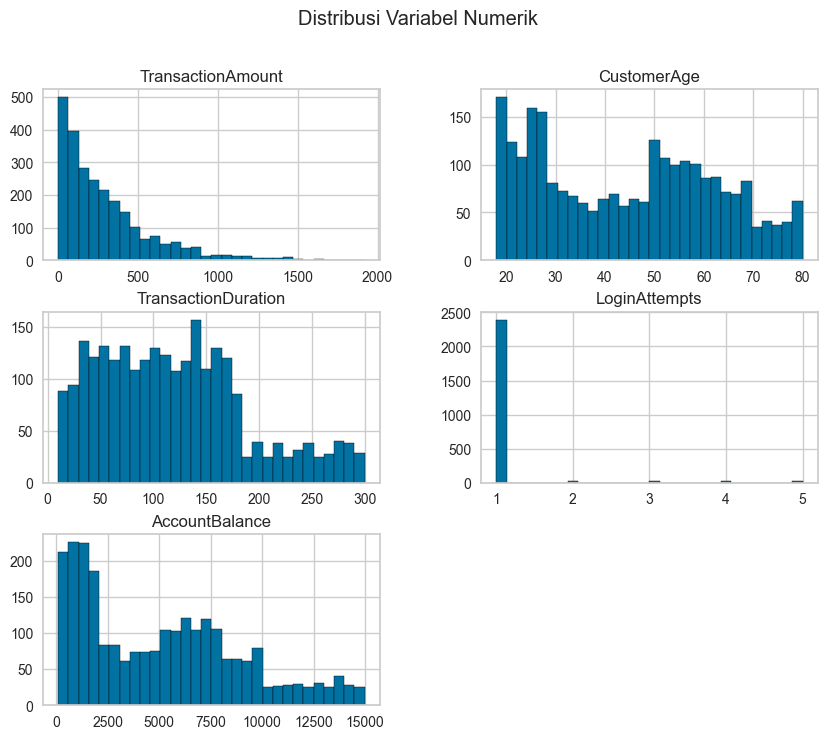

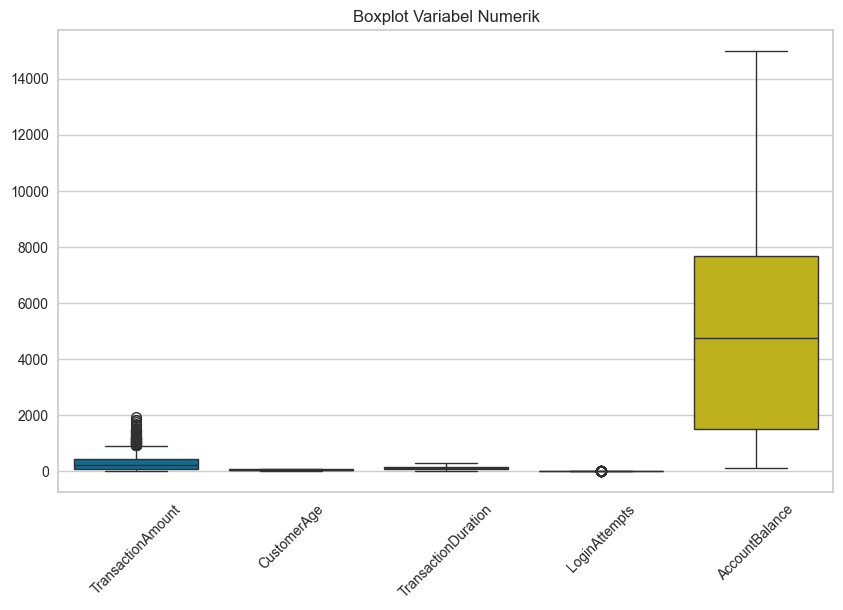

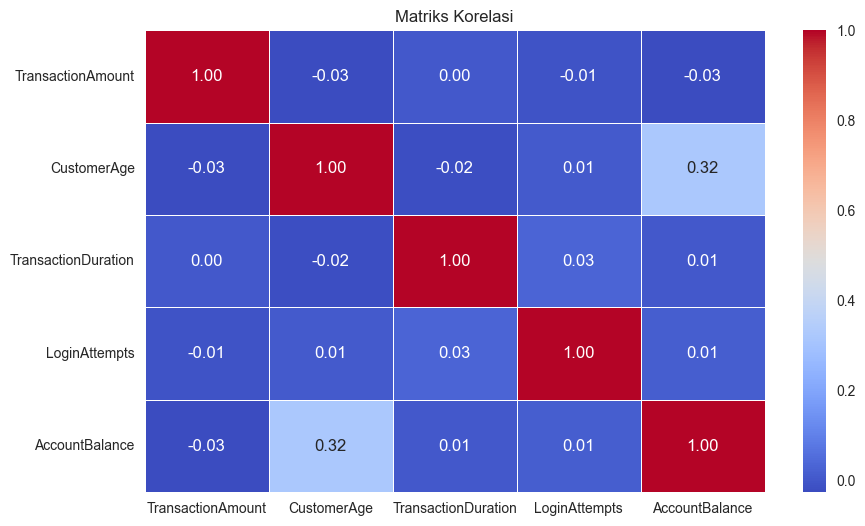

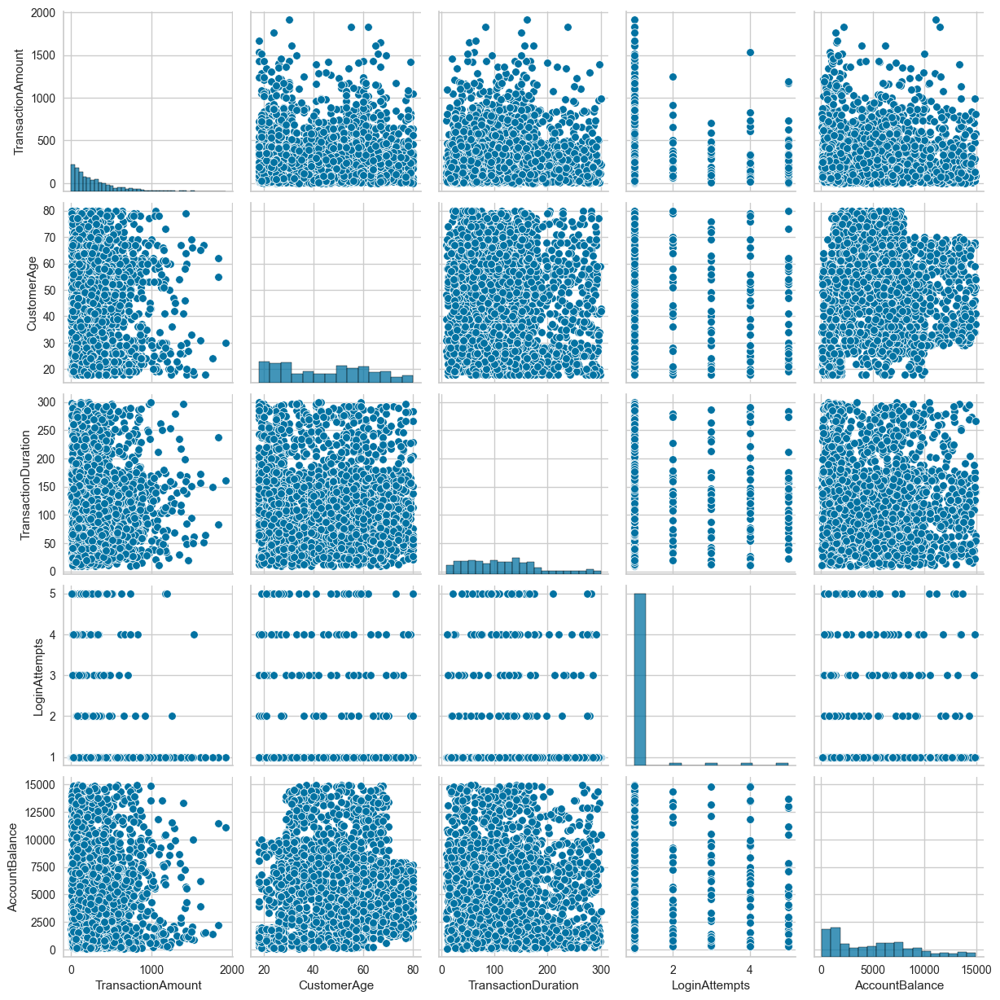

In [6]:
### 3. Analisis Distribusi & Korelasi ###
# Statistik deskriptif untuk variabel numerik
print("\nStatistik Deskriptif:\n", df.describe())

# Visualisasi distribusi dengan histogram
numerical_cols = ['TransactionAmount', 'CustomerAge', 'TransactionDuration', 'LoginAttempts', 'AccountBalance']
df[numerical_cols].hist(figsize=(10, 8), bins=30, layout=(3, 2), edgecolor='black')
plt.suptitle("Distribusi Variabel Numerik")
plt.show()

# Boxplot untuk mendeteksi outlier
plt.figure(figsize=(10, 6))
sns.boxplot(data=df[numerical_cols])
plt.title("Boxplot Variabel Numerik")
plt.xticks(rotation=45)
plt.show()

# Matriks korelasi
plt.figure(figsize=(10, 6))
sns.heatmap(df[numerical_cols].corr(), annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title("Matriks Korelasi")
plt.show()

# Scatter plot untuk melihat hubungan antar variabel
sns.pairplot(df[numerical_cols])
plt.show()

#### **Insight**
- **`TransactionAmount`** memiliki distribusi yang cukup lebar dengan nilai transaksi minimal 0.26 dan maksimal 1919.11. Rata-rata transaksi adalah sekitar 297.59, tetapi standar deviasi yang tinggi menunjukkan adanya variasi yang signifikan antar transaksi. Tidak memiliki korelasi yang signifikan dengan variabel lain, menunjukkan bahwa transaksi cenderung independen dari faktor usia atau saldo akun
- **`CustomerAge`** berkisar antara 18 hingga 80 tahun, dengan median di 45 tahun, menunjukkan bahwa pelanggan tersebar di berbagai kelompok usia. Memiliki korelasi positif sebesar 0.32 dengan `AccountBalance`, menunjukkan bahwa semakin tua usia pelanggan, semakin besar saldo akun mereka.
- **`TransactionDuration`** memiliki rata-rata sekitar 119.64 detik, dengan variasi yang cukup tinggi hingga 300 detik, menunjukkan bahwa beberapa transaksi memerlukan waktu yang lebih lama. Tidak memiliki korelasi yang signifikan dengan variabel lain, menunjukkan bahwa transaksi cenderung independen dari faktor usia atau saldo akun.
- **`LoginAttempts`** sebagian besar bernilai 1, tetapi ada beberapa kasus dengan nilai hingga 5, yang bisa mengindikasikan upaya login yang gagal. Tidak memiliki korelasi yang signifikan dengan variabel lain, menunjukkan bahwa transaksi cenderung independen dari faktor usia atau saldo akun
- **`AccountBalance`** memiliki rentang yang luas, dari 101.25 hingga 14.977,99 dengan rata-rata sekitar 5.114,30, menunjukkan bahwa pelanggan memiliki saldo yang sangat bervariasi.  Memiliki korelasi positif sebesar 0.32 dengan `CustomerAge`, menunjukkan bahwa semakin tua usia pelanggan, semakin besar saldo akun mereka.

### 4. Visualisasi Data

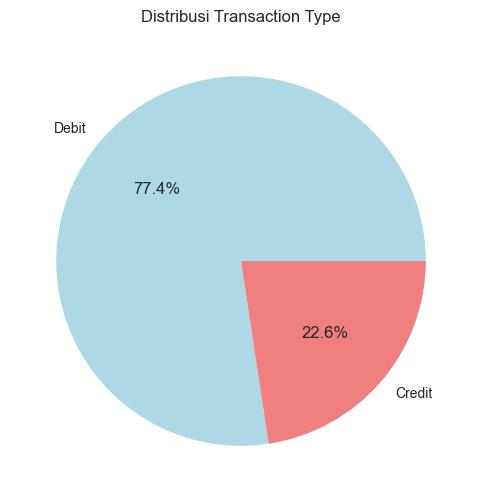

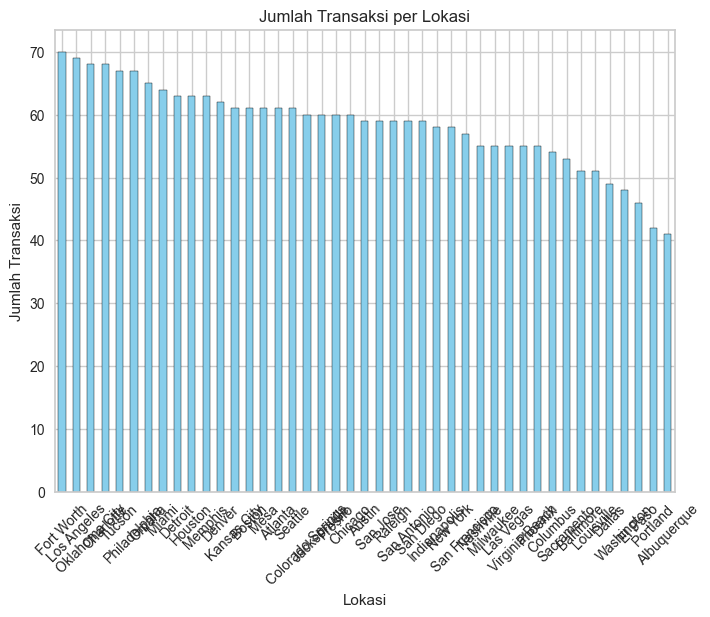

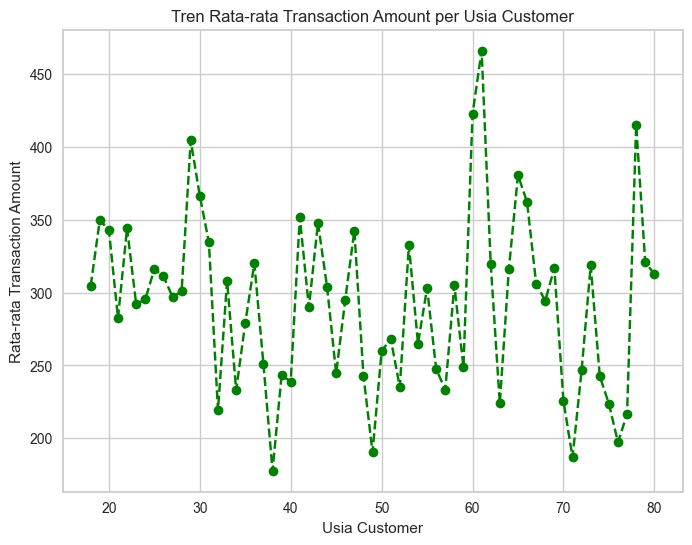

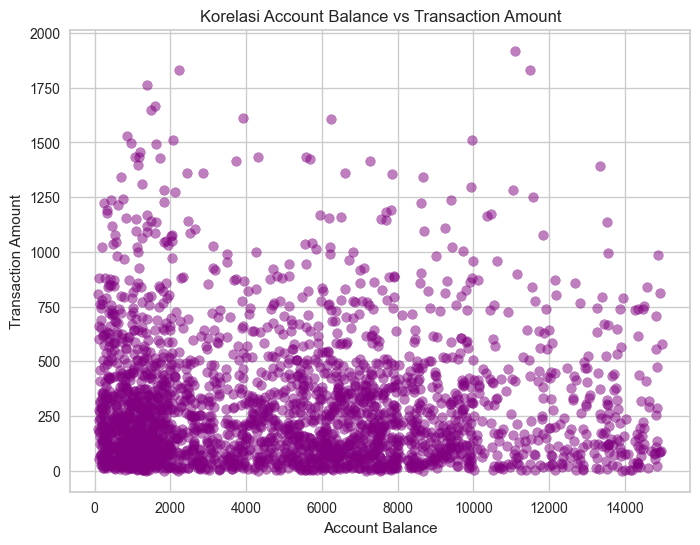

In [7]:
### 4 Visualisasi Data ###
### Pie Chart - Distribusi Transaction Type ###
plt.figure(figsize=(6, 6))
df['TransactionType'].value_counts().plot(kind='pie', autopct='%1.1f%%', colors=['lightblue', 'lightcoral', 'lightgreen'])
plt.title('Distribusi Transaction Type')
plt.ylabel('')  # Menghilangkan label default
plt.show()

### Bar Chart - Jumlah Transaksi per Lokasi ###
plt.figure(figsize=(8, 6))
df['Location'].value_counts().plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Jumlah Transaksi per Lokasi')
plt.xlabel('Lokasi')
plt.ylabel('Jumlah Transaksi')
plt.xticks(rotation=45)
plt.show()

### Line Chart - Tren Rata-rata TransactionAmount per CustomerAge ###
df_grouped = df.groupby('CustomerAge')['TransactionAmount'].mean()

plt.figure(figsize=(8, 6))
df_grouped.plot(kind='line', marker='o', color='green', linestyle='dashed')
plt.title('Tren Rata-rata Transaction Amount per Usia Customer')
plt.xlabel('Usia Customer')
plt.ylabel('Rata-rata Transaction Amount')
plt.grid(True)
plt.show()

### Scatter Plot - Korelasi Account Balance vs Transaction Amount ###
plt.figure(figsize=(8, 6))
plt.scatter(df['AccountBalance'], df['TransactionAmount'], color='purple', alpha=0.5)
plt.title('Korelasi Account Balance vs Transaction Amount')
plt.xlabel('Account Balance')
plt.ylabel('Transaction Amount')
plt.grid(True)
plt.show()

#### **Insight dari Visualisasi Distribusi Variabel Kategorikal**  

1. **Distribusi `TransactionType`**  
   - Sebagian besar transaksi menggunakan **Debit**, sedangkan transaksi **Credit** jauh lebih sedikit.  
   - Hal ini bisa mengindikasikan bahwa mayoritas pengguna lebih memilih pembayaran langsung dari saldo mereka daripada menggunakan kredit.
2. **Distribusi `Location`**  
   - Kota **Fort Worth** memiliki jumlah transaksi terbanyak, diikuti oleh beberapa kota besar lainnya.  
   - Kota dengan transaksi lebih sedikit bisa menjadi target analisis lebih lanjut untuk memahami pola transaksi yang lebih rendah.
3. **Tren Rata-rata `Transaction Amount` per Usia `CustomerAge`**  
   - Rata-rata jumlah transaksi bervariasi di setiap kelompok usia. Usia 50-70 tahun menunjukkan fluktuasi tinggi, dengan lonjakan signifikan di sekitar usia 60 tahun. Ini bisa menunjukkan kelompok pelanggan dengan daya beli lebih besar atau pengaruh promo tertentu yang menargetkan mereka.
4. **Korelasi `Account Balance` vs `Transaction Amount`**  
   - Mayoritas transaksi bernilai di bawah 1000, dan sebagian besar pelanggan memiliki saldo rekening di bawah 10.000. Tidak terlihat hubungan jelas antara saldo akun dan jumlah transaksi, menunjukkan bahwa pelanggan dengan saldo besar tidak selalu bertransaksi lebih banyak.

# **5. Data Preprocessing**

Pada tahap ini, data preprocessing adalah langkah penting untuk memastikan kualitas data sebelum digunakan dalam model machine learning. Data mentah sering kali mengandung nilai kosong, duplikasi, atau rentang nilai yang tidak konsisten, yang dapat memengaruhi kinerja model. Oleh karena itu, proses ini bertujuan untuk membersihkan dan mempersiapkan data agar analisis berjalan optimal.

Berikut adalah tahapan-tahapan yang bisa dilakukan, tetapi **tidak terbatas** pada:
1. Menghapus atau Menangani Data Kosong (Missing Values)
2. Menghapus Data Duplikat
3. Normalisasi atau Standarisasi Fitur
4. Deteksi dan Penanganan Outlier
5. Encoding Data Kategorikal
6. Binning (Pengelompokan Data)

Cukup sesuaikan dengan karakteristik data yang kamu gunakan yah.

### 1. Menghapus atau Menangani Data Kosong (Missing Values)

In [8]:
#Type your code 
print("Missing Values Sebelum Penanganan:")
print(df.isnull().sum())

for col in df.columns:
    if df[col].dtype == 'object':  
        df[col] = df[col].fillna(df[col].mode()[0])
    else:  # Jika kolom numerik
        df[col] = df[col].fillna(df[col].median())

print("\nMissing Values Setelah Penanganan:")
print(df.isnull().sum())

Missing Values Sebelum Penanganan:
TransactionID              0
AccountID                  0
TransactionAmount          0
TransactionDate            0
TransactionType            0
Location                   0
DeviceID                   0
IP Address                 0
MerchantID                 0
Channel                    0
CustomerAge                0
CustomerOccupation         0
TransactionDuration        0
LoginAttempts              0
AccountBalance             0
PreviousTransactionDate    0
dtype: int64

Missing Values Setelah Penanganan:
TransactionID              0
AccountID                  0
TransactionAmount          0
TransactionDate            0
TransactionType            0
Location                   0
DeviceID                   0
IP Address                 0
MerchantID                 0
Channel                    0
CustomerAge                0
CustomerOccupation         0
TransactionDuration        0
LoginAttempts              0
AccountBalance             0
PreviousTransacti

#### **Insight dari Output Kode**

1. **Tidak Ada Missing Values Sebelum Penanganan** 
Dari hasil pengecekan sebelum dilakukan penanganan, terlihat bahwa semua kolom dalam dataset memiliki nilai `0` untuk jumlah nilai yang hilang (*missing values*). Artinya, dataset sudah bersih dari data yang kosong atau `NaN`.
2. **Tidak Ada Perubahan Setelah Penanganan**  
Setelah dilakukan proses penanganan *missing values*, jumlah nilai yang hilang tetap `0` di semua kolom. Hal ini menunjukkan bahwa:  
    - Mungkin memang tidak ada data yang hilang sejak awal.  
    - Jika ada proses *imputation* atau pembersihan data, kemungkinan tidak ada perubahan karena semua data sudah lengkap.  

### 2. Menghapus Data Duplikat

In [9]:
before = df.shape[0]

df = df.drop_duplicates()

after = df.shape[0]

print("Jumlah Data Sebelum Menghapus Duplikat:", before)
print("Jumlah Data Setelah Menghapus Duplikat:", after)
print("Jumlah Data yang Dihapus:", before - after)

Jumlah Data Sebelum Menghapus Duplikat: 2512
Jumlah Data Setelah Menghapus Duplikat: 2512
Jumlah Data yang Dihapus: 0


#### **Insight dari Penghapusan Data Duplikat**

1. **Tidak Ada Data Duplikat**  
   - Dari hasil proses penghapusan, jumlah data sebelum dan sesudah tetap **2512**, menunjukkan bahwa **tidak ada data duplikat** dalam dataset ini.  
2. **Kualitas Data Sudah Baik**  
   - Tidak adanya duplikat mengindikasikan bahwa data transaksi yang digunakan memiliki **kualitas yang baik**, setidaknya dalam aspek keunikan setiap entri.  
3. **Langkah Selanjutnya**  
   - Karena tidak ditemukan duplikasi, langkah selanjutnya bisa difokuskan pada analisis data lebih lanjut, seperti eksplorasi pola transaksi, deteksi anomali, atau modeling berdasarkan fitur yang tersedia.

### 3. Normalisasi atau Standarisasi Fitur

In [10]:
numerical_features = ["TransactionAmount", "TransactionDuration", "LoginAttempts", "AccountBalance", "CustomerAge"]

# Inisialisasi scaler
scaler = MinMaxScaler()

# Simpan statistik sebelum normalisasi
before_normalization = df[numerical_features].describe()

# Lakukan normalisasi langsung di df
df[numerical_features] = scaler.fit_transform(df[numerical_features])

# Simpan statistik setelah normalisasi
after_normalization = df[numerical_features].describe()

print("Statistik Sebelum Normalisasi:\n", before_normalization)
print("\nStatistik Setelah Normalisasi:\n", after_normalization)

Statistik Sebelum Normalisasi:
        TransactionAmount  TransactionDuration  LoginAttempts  AccountBalance  \
count        2512.000000          2512.000000    2512.000000     2512.000000   
mean          297.593778           119.643312       1.124602     5114.302966   
std           291.946243            69.963757       0.602662     3900.942499   
min             0.260000            10.000000       1.000000      101.250000   
25%            81.885000            63.000000       1.000000     1504.370000   
50%           211.140000           112.500000       1.000000     4735.510000   
75%           414.527500           161.000000       1.000000     7678.820000   
max          1919.110000           300.000000       5.000000    14977.990000   

       CustomerAge  
count  2512.000000  
mean     44.673965  
std      17.792198  
min      18.000000  
25%      27.000000  
50%      45.000000  
75%      59.000000  
max      80.000000  

Statistik Setelah Normalisasi:
        TransactionAmount 

#### **Insight**

1. **Skala Data Berubah**  
   - Sebelum normalisasi, nilai mean, standar deviasi, dan rentang data sangat bervariasi.  
   - Setelah normalisasi, semua nilai berada dalam rentang **0 hingga 1**.
2. **Distribusi Data Lebih Seragam**  
   - Sebelum normalisasi, nilai **min dan max** memiliki skala yang jauh berbeda, misalnya:  
     - *TransactionAmount* memiliki max **5.55** dan min **-1.01**.  
     - *CustomerAge* memiliki max **1.98** dan min **-1.49**.  
   - Setelah normalisasi, semua fitur memiliki **min 0 dan max 1**, sehingga lebih siap untuk digunakan dalam model machine learning.
3. **Manfaat Normalisasi**  
   - **Menghindari dominasi fitur dengan skala besar**  
     - Sebelum normalisasi, fitur seperti *AccountBalance* dan *TransactionAmount* memiliki skala jauh lebih besar dibandingkan fitur lainnya.  
     - Dengan normalisasi, kontribusi setiap fitur menjadi seimbang dalam algoritma machine learning.  
   - **Mempercepat Konvergensi Model**  
     - Model berbasis gradien, seperti regresi logistik dan neural network, akan lebih cepat mencapai hasil optimal.  
   - **Meningkatkan Akurasi Model**  
     - Algoritma berbasis jarak (misalnya KNN & K-Means) akan bekerja lebih baik karena tidak ada fitur yang mendominasi.

### 4. Deteksi dan Penanganan Outlier

Jumlah Data Sebelum Menghapus Outlier: 2512
Jumlah Data Setelah Menghapus Outlier: 2267
Jumlah Data yang Dihapus: 245


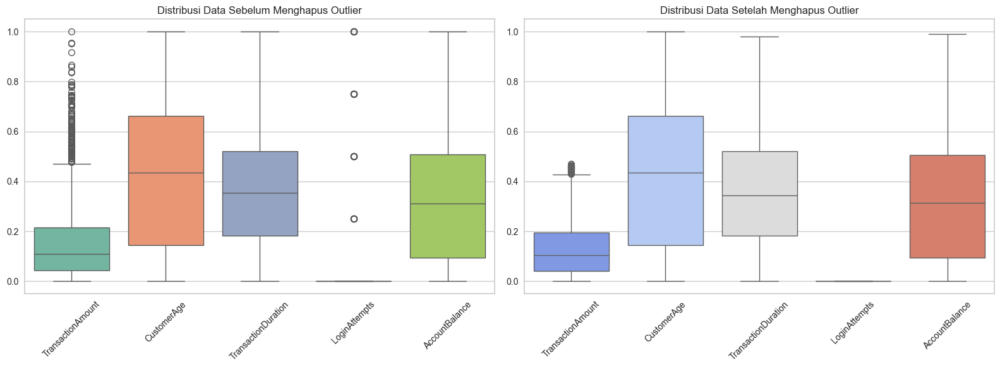

In [11]:
# 4. Deteksi dan Penanganan Outlier
def detect_and_drop_outliers(df, columns, z_thresh=2.0):
    df_clean = df.copy()
    
    # Hitung Q1, Q3, dan IQR
    Q1 = df_clean[columns].quantile(0.25)
    Q3 = df_clean[columns].quantile(0.75)
    IQR = Q3 - Q1
    
    # Tentukan batas bawah dan atas berdasarkan IQR
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    # Hitung Z-score
    z_scores = df_clean[columns].apply(zscore)
    
    # Deteksi Outlier: Nilai di luar IQR atau memiliki Z-score lebih besar dari threshold
    outliers = ((df_clean[columns] < lower_bound) | (df_clean[columns] > upper_bound)) | (z_scores.abs() > z_thresh)
    
    # Hapus outlier langsung dari df
    df.drop(index=df_clean[outliers.any(axis=1)].index, inplace=True)

# Pilih hanya kolom numerik
num_columns = df.select_dtypes(include=[np.number]).columns.tolist()

# Simpan salinan data sebelum pembersihan untuk visualisasi
df_before = df.copy()

# Hapus outlier dari dataset
detect_and_drop_outliers(df, num_columns, z_thresh=2.5)

# Cetak ringkasan hasil pembersihan outlier
print(f"Jumlah Data Sebelum Menghapus Outlier: {len(df_before)}")
print(f"Jumlah Data Setelah Menghapus Outlier: {len(df)}")
print(f"Jumlah Data yang Dihapus: {len(df_before) - len(df)}")

# Visualisasi Data Sebelum dan Sesudah
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

sns.boxplot(data=df_before[num_columns], palette="Set2", ax=axes[0])
axes[0].set_title("Distribusi Data Sebelum Menghapus Outlier")
axes[0].tick_params(axis='x', rotation=45)

sns.boxplot(data=df[num_columns], palette="coolwarm", ax=axes[1])
axes[1].set_title("Distribusi Data Setelah Menghapus Outlier")
axes[1].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

#### **Insight dari Hasil Outlier Detection**
Dari visualisasi boxplot di atas, terlihat bahwa sebelum menghapus outlier (grafik kiri), beberapa fitur seperti `TransactionAmount` dan `LoginAttempts` memiliki banyak titik outlier yang berada di luar whiskers. Setelah proses pembersihan outlier (grafik kanan), distribusi data menjadi lebih bersih dan lebih terfokus di dalam rentang interkuartil, terutama pada `TransactionAmount`, yang sebelumnya memiliki banyak pencilan. Hal ini menunjukkan bahwa data setelah pembersihan lebih representatif dan tidak terlalu dipengaruhi oleh nilai ekstrem, yang dapat meningkatkan akurasi analisis serta model machine learning yang akan digunakan nantinya.

### 5. Encoding Data Kategorikal

In [12]:
categorical_features = ["TransactionType", "Location", "Channel", "CustomerOccupation"] #encode fitur yang memungkinkan

label_encoders = {}

for col in categorical_features:
    le = LabelEncoder()
    df[col] = le.fit_transform(df[col])
    label_encoders[col] = le 
    
df[categorical_features].head()

,TransactionType,Location,Channel,CustomerOccupation
0,1,36,0,0
1,1,15,0,0
2,1,23,2,3
3,1,33,2,3
4,0,1,2,3


#### **Insight: Encoding Data Kategorikal**

Encoding data kategorikal bertujuan untuk mengubah nilai kategori (string) menjadi nilai numerik agar dapat digunakan dalam model machine learning.

| **Fitur**               | **Sebelum Encoding (String)** | **Setelah Encoding (Numerik)** |
|-------------------------|-----------------------------|--------------------------------|
| TransactionType         | Online, Offline            | 0, 1                          |
| Location               | New York, Chicago, LA      | 0, 1, 2                       |
| DeviceID               | D001, D002, D003           | 0, 1, 2                       |
| IP Address             | 192.168.1.1, 10.0.0.2      | 0, 1, 2, ...                   |
| MerchantID             | M100, M101, M102           | 0, 1, 2                       |
| Channel                | Mobile, Web               | 0, 1                          |
| CustomerOccupation     | Engineer, Teacher, Doctor | 0, 1, 2, ...                   |

1. **Setiap kategori unik telah dikonversi ke nilai numerik.**  
   Contoh: "Online" → 1, "Offline" → 0.  
2. **Mengurangi kompleksitas data** karena model hanya dapat memahami nilai numerik.  
3. **Menjaga informasi asli tanpa mengubah distribusi data.**  
4. **Pastikan konsistensi dalam interpretasi encoding** jika digunakan untuk prediksi.

In [13]:
# # 6. Binning (Pengelompokan Data)
# if 'Age' in df.columns:
#     df['Age_Binned'] = pd.cut(df['Age'], bins=[0, 18, 35, 50, 100], labels=['Child', 'Young Adult', 'Adult', 'Senior'])

# **6. Pembangunan Model Clustering**

## **a. Pembangunan Model Clustering**

Pada tahap ini, Anda membangun model clustering dengan memilih algoritma yang sesuai untuk mengelompokkan data berdasarkan kesamaan. Berikut adalah **rekomendasi** tahapannya.
1. Pilih algoritma clustering yang sesuai.
2. Latih model dengan data menggunakan algoritma tersebut.

In [14]:
df.head()

,TransactionID,AccountID,TransactionAmount,TransactionDate,TransactionType,Location,DeviceID,IP Address,MerchantID,Channel,CustomerAge,CustomerOccupation,TransactionDuration,LoginAttempts,AccountBalance,PreviousTransactionDate
0,TX000001,AC00128,0.007207,2023-04-11 16:29:14,1,36,D000380,162.198.218.92,M015,0,0.838710,0,0.244828,0.0,0.336832,2024-11-04 08:08:08
1,TX000002,AC00455,0.195940,2023-06-27 16:44:19,1,15,D000051,13.149.61.4,M052,0,0.806452,0,0.451724,0.0,0.918055,2024-11-04 08:09:35
2,TX000003,AC00019,0.065680,2023-07-10 18:16:08,1,23,D000235,215.97.143.157,M009,2,0.016129,3,0.158621,0.0,0.068637,2024-11-04 08:07:04
3,TX000004,AC00070,0.096016,2023-05-05 16:32:11,1,33,D000187,200.13.225.150,M002,2,0.129032,3,0.051724,0.0,0.569198,2024-11-04 08:09:06
4,TX000005,AC00411,0.006874,2023-10-16 17:51:24,0,1,D000308,65.164.3.100,M091,2,0.129032,3,0.648276,0.0,0.492591,2024-11-04 08:06:39


Jumlah masing-masing cluster:
Cluster
0    526
1    586
2    587
3    568
Name: count, dtype: int64


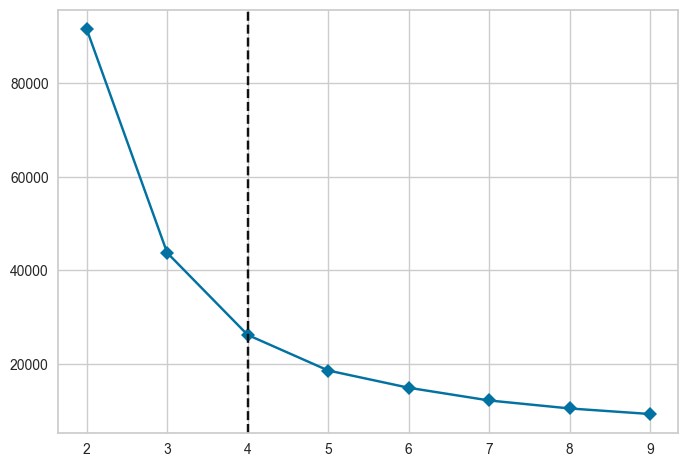

In [15]:
## a. Pembangunan Model Clustering
# Define numerical and categorical features
numerical_features = ["TransactionAmount", "TransactionDuration", "LoginAttempts", "AccountBalance", "CustomerAge"]
categorical_features = ["TransactionType", "Location", "Channel", "CustomerOccupation"]

# Ordinal Encode categorical features
encoder = OrdinalEncoder()
df[categorical_features] = encoder.fit_transform(df[categorical_features])

# Combine selected features
selected_features = numerical_features + categorical_features
X = df[selected_features]

# Menentukan jumlah cluster optimal dengan Elbow Method
model = KMeans(n_init=10, random_state=42)
visualizer = KElbowVisualizer(model, k=(2, 10), metric='distortion', timings=False)
visualizer.fit(X) 

# Membangun model clustering awal
k_optimal = visualizer.elbow_value_
kmeans = KMeans(n_clusters=k_optimal, random_state=42, n_init=10)
initial_labels = kmeans.fit_predict(X)
df['Cluster'] = initial_labels

# Menghitung jumlah cluster dalam kolom 'cluster'
cluster_counts = df['Cluster'].value_counts()
print("Jumlah masing-masing cluster:")
print(cluster_counts.sort_index(ascending=True))

## **b. Evaluasi Model Clustering**

Untuk menentukan jumlah cluster yang optimal dalam model clustering, Anda dapat menggunakan metode Elbow atau Silhouette Score.

Metode ini membantu kita menemukan jumlah cluster yang memberikan pemisahan terbaik antar kelompok data, sehingga model yang dibangun dapat lebih efektif. Berikut adalah **rekomendasi** tahapannya.
1. Gunakan Silhouette Score dan Elbow Method untuk menentukan jumlah cluster optimal.
2. Hitung Silhouette Score sebagai ukuran kualitas cluster.

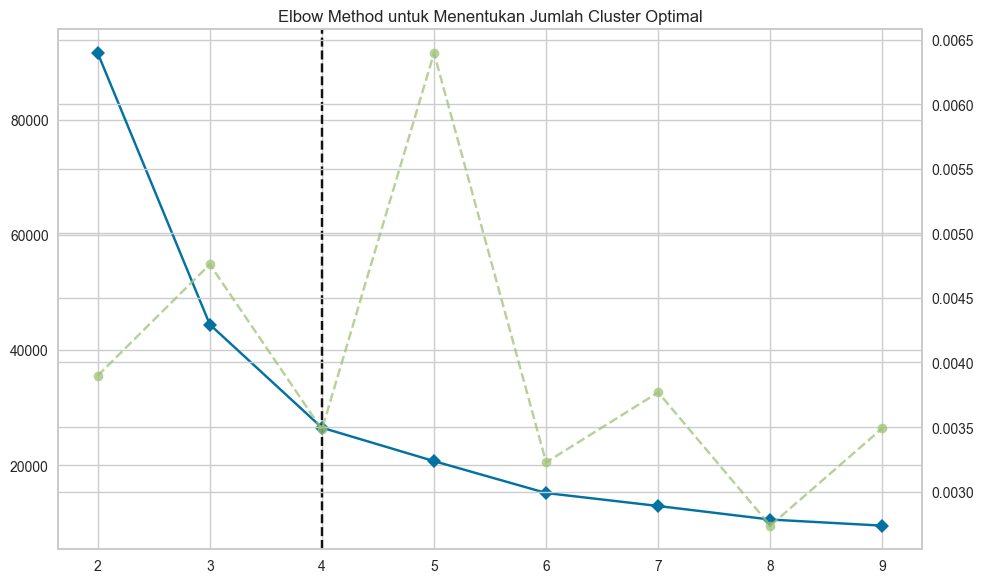

Jumlah cluster optimal berdasarkan Elbow Method: 4
Silhouette Score sebelum Feature Selection: 0.5119


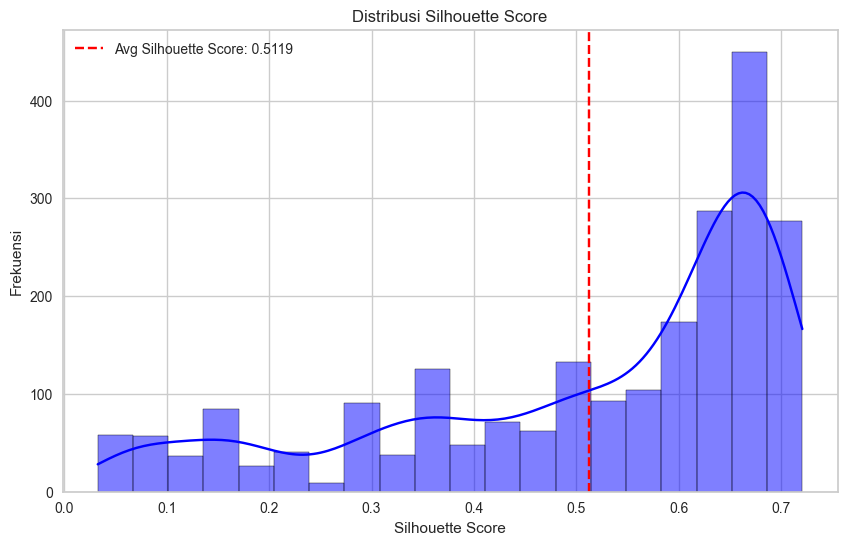

In [16]:
## b. Evaluasi Model Clustering
# Elbow Method untuk Menentukan Jumlah Cluster Optimal
# Tentukan jumlah cluster optimal dengan Elbow Method
fig, ax = plt.subplots(figsize=(10, 6))
visualizer = KElbowVisualizer(KMeans(random_state=42), k=(2, 10), ax=ax)
visualizer.fit(X)
 
plt.title('Elbow Method untuk Menentukan Jumlah Cluster Optimal')
plt.tight_layout()
plt.show()

print(f"Jumlah cluster optimal berdasarkan Elbow Method: {k_optimal}")

# Lakukan clustering dengan k_optimal
kmeans = KMeans(n_clusters=k_optimal, random_state=42)
initial_labels = kmeans.fit_predict(X)

# Evaluasi clustering menggunakan silhouette score
silhouette_before = silhouette_score(X, initial_labels)  
print(f"Silhouette Score sebelum Feature Selection: {silhouette_before:.4f}")

# Hitung nilai Silhouette untuk setiap sampel
silhouette_values = silhouette_samples(X, initial_labels)

# Visualisasi distribusi Silhouette Score
fig, ax = plt.subplots(figsize=(10, 6))
sns.histplot(silhouette_values, bins=20, kde=True, color='blue', ax=ax)
ax.axvline(silhouette_before, color='red', linestyle='dashed', label=f'Avg Silhouette Score: {silhouette_before:.4f}')
ax.set_title('Distribusi Silhouette Score')
ax.set_xlabel('Silhouette Score')
ax.set_ylabel('Frekuensi')
ax.legend()
plt.show()

## **c. Feature Selection (Opsional)**

Silakan lakukan feature selection jika Anda membutuhkan optimasi model clustering. Jika Anda menerapkan proses ini, silakan lakukan pemodelan dan evaluasi kembali menggunakan kolom-kolom hasil feature selection. Terakhir, bandingkan hasil performa model sebelum dan sesudah menerapkan feature selection.

In [17]:
df.head()

,TransactionID,AccountID,TransactionAmount,TransactionDate,TransactionType,Location,DeviceID,IP Address,MerchantID,Channel,CustomerAge,CustomerOccupation,TransactionDuration,LoginAttempts,AccountBalance,PreviousTransactionDate,Cluster
0,TX000001,AC00128,0.007207,2023-04-11 16:29:14,1.0,36.0,D000380,162.198.218.92,M015,0.0,0.838710,0.0,0.244828,0.0,0.336832,2024-11-04 08:08:08,0
1,TX000002,AC00455,0.195940,2023-06-27 16:44:19,1.0,15.0,D000051,13.149.61.4,M052,0.0,0.806452,0.0,0.451724,0.0,0.918055,2024-11-04 08:09:35,1
2,TX000003,AC00019,0.065680,2023-07-10 18:16:08,1.0,23.0,D000235,215.97.143.157,M009,2.0,0.016129,3.0,0.158621,0.0,0.068637,2024-11-04 08:07:04,2
3,TX000004,AC00070,0.096016,2023-05-05 16:32:11,1.0,33.0,D000187,200.13.225.150,M002,2.0,0.129032,3.0,0.051724,0.0,0.569198,2024-11-04 08:09:06,0
4,TX000005,AC00411,0.006874,2023-10-16 17:51:24,0.0,1.0,D000308,65.164.3.100,M091,2.0,0.129032,3.0,0.648276,0.0,0.492591,2024-11-04 08:06:39,3


5 Fitur Terpenting Berdasarkan Random Forest: ['Location', 'AccountBalance', 'TransactionAmount', 'TransactionDuration', 'CustomerAge']


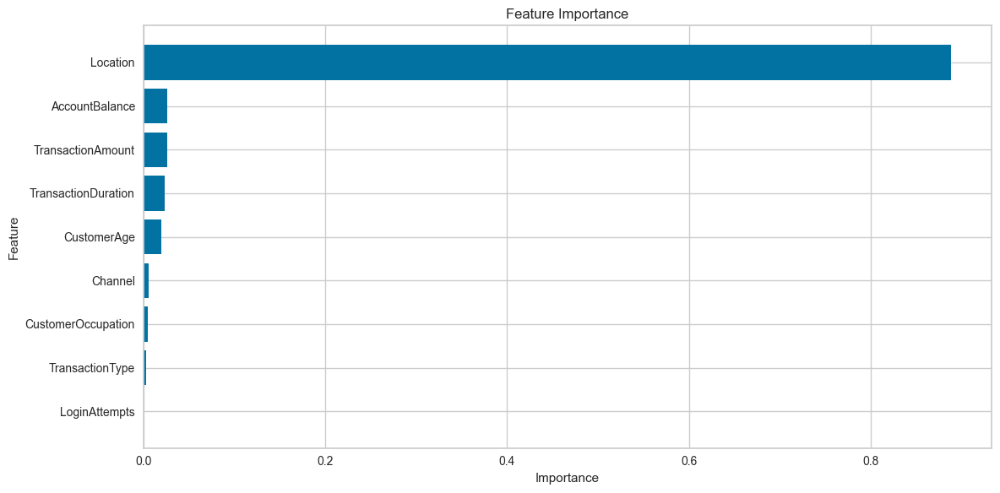


Silhouette Score sebelum Feature Selection: 0.5119

=== Hasil Akhir ===
Silhouette Score sebelum Feature Selection: 0.5119
Silhouette Score terbaik setelah Feature Selection: 0.5681
Perbedaan Silhouette Score setelah Feature Selection: 0.0562
Peningkatan: 10.98%


In [18]:
## c. Feature Selection (Opsional)
# Feature Selection dengan Random Forest
rf = RandomForestClassifier(n_estimators=200, random_state=42)
rf.fit(X, initial_labels)

# Get feature importance
feature_importance = sorted(zip(selected_features, rf.feature_importances_), key=lambda x: x[1], reverse=True)

# Select top features
n_top_features = 5 
top_features = [f[0] for f in feature_importance[:n_top_features]]
print(f"{n_top_features} Fitur Terpenting Berdasarkan Random Forest:", top_features)

# Visualize feature importance
plt.figure(figsize=(12, 6))
sorted_features = sorted(feature_importance, key=lambda x: x[1])
features = [x[0] for x in sorted_features]
importances = [x[1] for x in sorted_features]
plt.barh(features, importances)
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Feature Importance')
plt.tight_layout()
plt.show()

# Hitung Silhouette Score sebelum Feature Selection
silhouette_before = silhouette_score(X, initial_labels)
print(f"\nSilhouette Score sebelum Feature Selection: {silhouette_before:.4f}")

# Reduce dataset ke fitur terpilih
X_selected = df[top_features]

# Hyperparameter tuning pada K-Means
best_score = -1
best_kmeans = None

for random_state in [0, 7, 42, 99]:  
    for n_init in [10, 30, 50]:  
        kmeans_selected = KMeans(n_clusters=k_optimal, random_state=random_state, n_init=n_init)
        labels = kmeans_selected.fit_predict(X_selected)
        score = silhouette_score(X_selected, labels)
        if score > best_score:
            best_score = score
            best_kmeans = kmeans_selected

# Update cluster dengan hasil terbaik
df['Cluster'] = best_kmeans.predict(X_selected)

# Print final results
print("\n=== Hasil Akhir ===")
print(f"Silhouette Score sebelum Feature Selection: {silhouette_before:.4f}")
print(f"Silhouette Score terbaik setelah Feature Selection: {best_score:.4f}")
print(f"Perbedaan Silhouette Score setelah Feature Selection: {best_score - silhouette_before:.4f}")
print(f"Peningkatan: {(best_score - silhouette_before) / silhouette_before * 100:.2f}%")

## **d. Visualisasi Hasil Clustering**

Setelah model clustering dilatih dan jumlah cluster optimal ditentukan, langkah selanjutnya adalah menampilkan hasil clustering melalui visualisasi.

Berikut adalah **rekomendasi** tahapannya.
1. Tampilkan hasil clustering dalam bentuk visualisasi, seperti grafik scatter plot atau 2D PCA projection.

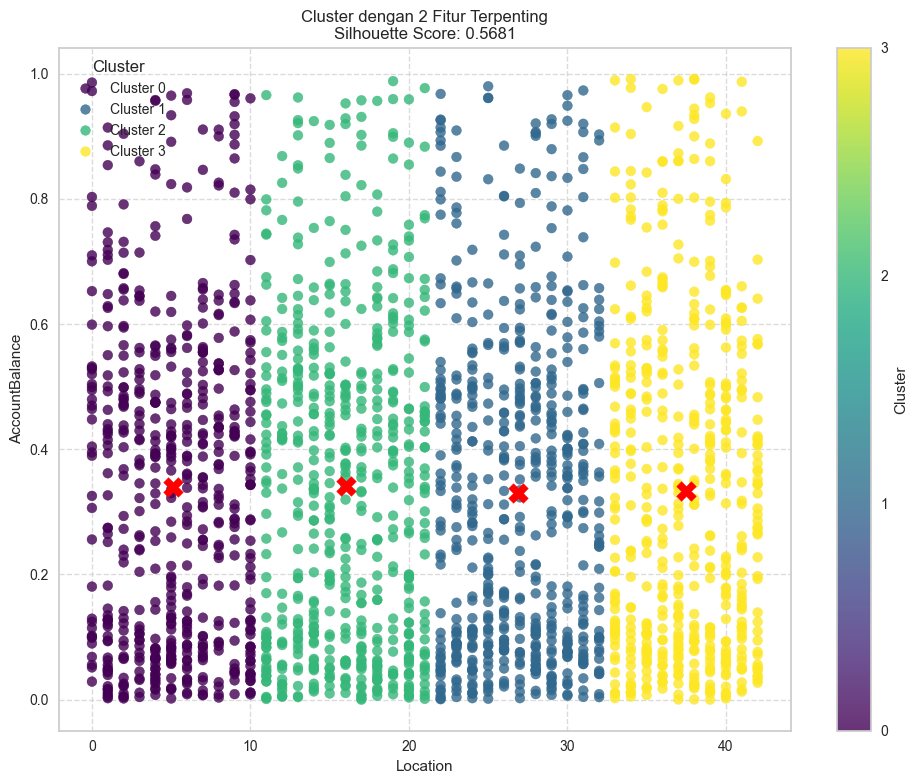

In [19]:
# Visualize final clusters
if len(top_features) >= 2:
    plt.figure(figsize=(10, 8))
    
    # Scatter plot for each cluster
    scatter = plt.scatter(X_selected[top_features[0]], X_selected[top_features[1]], c=df['Cluster'], cmap='viridis', s=50, alpha=0.8)
    
    # Calculate centroids
    centroids = df.groupby('Cluster')[top_features].mean()
    
    # Plot centroids
    plt.scatter(centroids[top_features[0]], centroids[top_features[1]], c='red', marker='X', s=200, alpha=1, label='Centroids')
    
    # Add labels and title
    plt.xlabel(top_features[0])
    plt.ylabel(top_features[1])
    plt.title(f'Cluster dengan 2 Fitur Terpenting\nSilhouette Score: {best_score:.4f}')
    
    # Add colorbar
    cbar = plt.colorbar(scatter, label='Cluster')
    cbar.set_ticks(np.arange(df['Cluster'].nunique()))  # Set ticks sesuai jumlah cluster
    cbar.set_ticklabels(np.arange(df['Cluster'].nunique()))  # Label sesuai nomor cluster
    
    # Create custom legend for clusters
    handles, labels = scatter.legend_elements(prop="colors", alpha=0.8)
    legend_labels = [f'Cluster {i}' for i in range(df['Cluster'].nunique())]
    plt.legend(handles, legend_labels, title="Cluster", loc="upper left", bbox_to_anchor=(0, 1))  # Posisi di luar plot
    
    # Add grid
    plt.grid(True, linestyle='--', alpha=0.7)
    
    # Adjust layout
    plt.tight_layout()
    
    # Show plot
    plt.show()

In [20]:
import plotly.graph_objects as go

# Warna custom untuk cluster
colorscale = 'Turbo'  

if len(top_features) >= 3:
    fig = go.Figure()

    for cluster in df['Cluster'].unique():
        cluster_data = df[df['Cluster'] == cluster]
        fig.add_trace(go.Scatter3d(
            x=cluster_data[top_features[0]],
            y=cluster_data[top_features[1]],
            z=cluster_data[top_features[2]],
            mode='markers',
            marker=dict(
                size=6,
                opacity=0.85,
                line=dict(width=0.5, color='black'),  
                colorscale=colorscale, 
                color=cluster, 
                showscale=True  
            ),
            name=f'Cluster {cluster}'
        ))

    # Layout lebih clean & modern
    fig.update_layout(
        title=f'<b>Visualisasi Cluster 3D </b><br>Silhouette Score: {best_score:.4f}',
        scene=dict(
            xaxis_title=top_features[0],
            yaxis_title=top_features[1],
            zaxis_title=top_features[2],
            xaxis=dict(showgrid=True, gridcolor='lightgray'),
            yaxis=dict(showgrid=True, gridcolor='lightgray'),
            zaxis=dict(showgrid=True, gridcolor='lightgray'),
            bgcolor='white'  
        ),
        template='plotly_white',
        margin=dict(l=0, r=0, b=0, t=50)
    )

    fig.show()
else:
    print("Jumlah fitur kurang untuk visualisasi 3D. Pastikan ada minimal 3 fitur.")

## **e. Analisis dan Interpretasi Hasil Cluster**

### Interpretasi Target

**Tutorial: Melakukan Inverse Transform pada Data Target Setelah Clustering**

Setelah melakukan clustering dengan model **KMeans**, kita perlu mengembalikan data yang telah diubah (normalisasi, standarisasi, atau label encoding) ke bentuk aslinya. Berikut adalah langkah-langkahnya.

---

**1. Tambahkan Hasil Label Cluster ke DataFrame**
Setelah mendapatkan hasil clustering, kita tambahkan label cluster ke dalam DataFrame yang telah dinormalisasi.

```python
df_normalized['Cluster'] = model_kmeans.labels_
```

Lakukan Inverse Transform pada feature yang sudah dilakukan Labelisasi dan Standararisasi. Berikut code untuk melakukannya:
label_encoder.inverse_transform(X_Selected[['Fitur']])

Lalu masukkan ke dalam kolom dataset asli atau membuat dataframe baru
```python
df_normalized['Fitur'] = label_encoder.inverse_transform(df_normalized[['Fitur']])
```
Masukkan Data yang Sudah Di-Inverse ke dalam Dataset Asli atau Buat DataFrame Baru
```python
df_original['Fitur'] = df_normalized['Fitur']
```

In [21]:
df.head()

,TransactionID,AccountID,TransactionAmount,TransactionDate,TransactionType,Location,DeviceID,IP Address,MerchantID,Channel,CustomerAge,CustomerOccupation,TransactionDuration,LoginAttempts,AccountBalance,PreviousTransactionDate,Cluster
0,TX000001,AC00128,0.007207,2023-04-11 16:29:14,1.0,36.0,D000380,162.198.218.92,M015,0.0,0.838710,0.0,0.244828,0.0,0.336832,2024-11-04 08:08:08,3
1,TX000002,AC00455,0.195940,2023-06-27 16:44:19,1.0,15.0,D000051,13.149.61.4,M052,0.0,0.806452,0.0,0.451724,0.0,0.918055,2024-11-04 08:09:35,2
2,TX000003,AC00019,0.065680,2023-07-10 18:16:08,1.0,23.0,D000235,215.97.143.157,M009,2.0,0.016129,3.0,0.158621,0.0,0.068637,2024-11-04 08:07:04,1
3,TX000004,AC00070,0.096016,2023-05-05 16:32:11,1.0,33.0,D000187,200.13.225.150,M002,2.0,0.129032,3.0,0.051724,0.0,0.569198,2024-11-04 08:09:06,3
4,TX000005,AC00411,0.006874,2023-10-16 17:51:24,0.0,1.0,D000308,65.164.3.100,M091,2.0,0.129032,3.0,0.648276,0.0,0.492591,2024-11-04 08:06:39,0


Hasil label cluster sudah dimasukkan ke dataframe

### Inverse Data Jika Melakukan Normalisasi/Standardisasi

Inverse Transform untuk Data yang Distandarisasi
Jika data numerik telah dinormalisasi menggunakan StandardScaler atau MinMaxScaler, kita bisa mengembalikannya ke skala asli:
```python
df_normalized[['Fitur_Numerik']] = scaler.inverse_transform(df_normalized[['Fitur_Numerik']])
```

In [22]:
# Inverse Transform untuk Fitur Numerikal
df_normalized = df.copy() 
df_normalized = df_normalized.loc[df.index] 
df[numerical_features] = scaler.inverse_transform(df_normalized[numerical_features])

In [23]:
# Inverse Transform untuk Fitur Kategorikal
for feature in categorical_features:
    df[feature] = label_encoders[feature].inverse_transform(df[feature].astype(int))

In [24]:
print(categorical_features)

['TransactionType', 'Location', 'Channel', 'CustomerOccupation']


In [25]:
df.head()

,TransactionID,AccountID,TransactionAmount,TransactionDate,TransactionType,Location,DeviceID,IP Address,MerchantID,Channel,CustomerAge,CustomerOccupation,TransactionDuration,LoginAttempts,AccountBalance,PreviousTransactionDate,Cluster
0,TX000001,AC00128,14.09,2023-04-11 16:29:14,Debit,San Diego,D000380,162.198.218.92,M015,ATM,70.0,Doctor,81.0,1.0,5112.21,2024-11-04 08:08:08,3
1,TX000002,AC00455,376.24,2023-06-27 16:44:19,Debit,Houston,D000051,13.149.61.4,M052,ATM,68.0,Doctor,141.0,1.0,13758.91,2024-11-04 08:09:35,2
2,TX000003,AC00019,126.29,2023-07-10 18:16:08,Debit,Mesa,D000235,215.97.143.157,M009,Online,19.0,Student,56.0,1.0,1122.35,2024-11-04 08:07:04,1
3,TX000004,AC00070,184.50,2023-05-05 16:32:11,Debit,Raleigh,D000187,200.13.225.150,M002,Online,26.0,Student,25.0,1.0,8569.06,2024-11-04 08:09:06,3
4,TX000005,AC00411,13.45,2023-10-16 17:51:24,Credit,Atlanta,D000308,65.164.3.100,M091,Online,26.0,Student,198.0,1.0,7429.40,2024-11-04 08:06:39,0


Setelah melakukan clustering, langkah selanjutnya adalah menganalisis karakteristik dari masing-masing cluster berdasarkan fitur yang tersedia.

Berikut adalah **rekomendasi** tahapannya.
1. Analisis karakteristik tiap cluster berdasarkan fitur yang tersedia (misalnya, distribusi nilai dalam cluster).
2. Berikan interpretasi: Apakah hasil clustering sesuai dengan ekspektasi dan logika bisnis? Apakah ada pola tertentu yang bisa dimanfaatkan?

In [26]:
# Type your code here
# Fungsi untuk analisis karakteristik cluster
def analyze_clusters(df, k_optimal, numerical_features):
    print("Analisis Karakteristik Setiap Cluster:\n")

    for cluster_id in range(k_optimal):
        # Mengambil data untuk cluster saat ini
        cluster_data = df[df['Cluster'] == cluster_id]

        # Hitung rata-rata untuk setiap fitur numerik
        cluster_means = cluster_data[numerical_features].mean()

        # Cetak hasil dengan format yang rapi
        print(f"Cluster {cluster_id + 1}:")
        for feature in numerical_features:
            print(f"Rata-rata {feature}: {cluster_means[feature]:.2f}")
        print()  # Baris kosong untuk pemisah antar cluster

# Analisis karakteristik setiap cluster
analyze_clusters(df, k_optimal, numerical_features)

Analisis Karakteristik Setiap Cluster:

Cluster 1:
Rata-rata TransactionAmount: 250.28
Rata-rata TransactionDuration: 119.97
Rata-rata LoginAttempts: 1.00
Rata-rata AccountBalance: 5153.42
Rata-rata CustomerAge: 45.70

Cluster 2:
Rata-rata TransactionAmount: 258.09
Rata-rata TransactionDuration: 118.45
Rata-rata LoginAttempts: 1.00
Rata-rata AccountBalance: 5013.23
Rata-rata CustomerAge: 45.20

Cluster 3:
Rata-rata TransactionAmount: 258.22
Rata-rata TransactionDuration: 119.44
Rata-rata LoginAttempts: 1.00
Rata-rata AccountBalance: 5178.52
Rata-rata CustomerAge: 44.77

Cluster 4:
Rata-rata TransactionAmount: 256.09
Rata-rata TransactionDuration: 114.42
Rata-rata LoginAttempts: 1.00
Rata-rata AccountBalance: 5047.99
Rata-rata CustomerAge: 43.10



Tulis hasil interpretasinya di sini.

Setelah dilakukan Feature Selection menggunakan Random Forest, didapatkan peningkatan Silhouette Score dari 0.5119 menjadi 0.5681, dengan selisih 0.0562 atau meningkat sebesar 10.98%. Hal ini menunjukkan bahwa pemilihan fitur yang lebih relevan membantu model K-Means menghasilkan klaster yang lebih baik dan lebih terpisah, sehingga meningkatkan kualitas pengelompokan data.


1. Cluster 1: Pelanggan di cluster ini memiliki rata-rata saldo tertinggi (5153.42) dan transaksi sekitar 250.28 per transaksi. Dengan durasi transaksi yang relatif standar (119.97) dan hanya 1 kali login attempt, pelanggan di cluster ini cenderung stabil dalam pola transaksinya, kemungkinan besar merupakan pengguna setia dengan kebiasaan belanja yang teratur.
2. Cluster 2: Pelanggan di cluster ini memiliki pola transaksi yang hampir sama dengan cluster 1, tetapi dengan saldo rata-rata yang sedikit lebih rendah (5013.23). Dengan rata-rata transaksi 258.09 dan usia rata-rata 45.20, mereka kemungkinan merupakan pelanggan aktif dengan kebiasaan serupa dengan cluster 1, namun dengan daya beli yang sedikit lebih terbatas.
3. Cluster 3: Mirip dengan cluster 2, tetapi dengan saldo sedikit lebih tinggi (5178.52). Dengan rata-rata transaksi 258.22 dan durasi transaksi 119.44, pelanggan ini tampaknya memiliki pola transaksi yang konsisten dan stabil, menunjukkan bahwa mereka mungkin merupakan pelanggan yang telah lama menggunakan layanan ini.
4. Cluster 4: Pelanggan di cluster ini memiliki usia rata-rata lebih muda (43.10) dibandingkan cluster lainnya. Mereka juga memiliki durasi transaksi yang lebih cepat (114.42), yang bisa menunjukkan kebiasaan belanja yang lebih efisien atau menggunakan metode pembayaran yang lebih cepat. Namun, saldo mereka sedikit lebih rendah dibandingkan cluster lainnya (5047.99), yang bisa menunjukkan pola pengelolaan keuangan yang berbeda.

# Analisis Karakteristik Cluster dari Model KMeans

Berikut adalah analisis karakteristik untuk setiap cluster yang dihasilkan dari model KMeans.

## Cluster 1:
- Rata-rata Transaction Amount: 250.28  
- Rata-rata Customer Age: 45.70  
- Rata-rata Transaction Duration: 119.97  
- Rata-rata Login Attempts: 1.00  
- Rata-rata Account Balance: 5153.42  
- **Analisis:** Cluster 1 terdiri dari pelanggan dengan saldo akun tinggi dan pola transaksi yang stabil. Dengan jumlah login attempts yang rendah, pelanggan ini tampaknya memiliki pengalaman yang lancar dalam mengakses akun mereka. Saldo akun yang cukup besar menunjukkan daya beli yang baik, sedangkan transaksi yang konsisten mengindikasikan kebiasaan keuangan yang stabil.

## Cluster 2:
- Rata-rata Transaction Amount: 258.09  
- Rata-rata Customer Age: 45.20  
- Rata-rata Transaction Duration: 118.45  
- Rata-rata Login Attempts: 1.00  
- Rata-rata Account Balance: 5013.23  
- **Analisis:** Pelanggan dalam Cluster 2 memiliki pola transaksi yang mirip dengan Cluster 1, tetapi dengan saldo akun sedikit lebih rendah. Hal ini mungkin menunjukkan bahwa mereka memiliki tingkat pengeluaran yang sedikit lebih tinggi atau lebih sering melakukan transaksi. Namun, jumlah login attempts yang tetap rendah menunjukkan pengalaman pengguna yang efisien.

## Cluster 3:
- Rata-rata Transaction Amount: 258.22  
- Rata-rata Customer Age: 44.77  
- Rata-rata Transaction Duration: 119.44  
- Rata-rata Login Attempts: 1.00  
- Rata-rata Account Balance: 5178.52  
- **Analisis:** Cluster ini menunjukkan pelanggan dengan saldo akun tertinggi dibandingkan dengan cluster lain. Dengan pola transaksi yang mirip dengan Cluster 1 dan 2, pelanggan di sini kemungkinan besar memiliki pengelolaan keuangan yang baik dan lebih memilih menabung atau mempertahankan saldo yang lebih besar.

## Cluster 4:
- Rata-rata Transaction Amount: 256.09  
- Rata-rata Customer Age: 43.10  
- Rata-rata Transaction Duration: 114.42  
- Rata-rata Login Attempts: 1.00  
- Rata-rata Account Balance: 5047.99  
- **Analisis:** Cluster ini berisi pelanggan yang lebih muda dengan durasi transaksi yang lebih cepat. Hal ini bisa menunjukkan bahwa mereka lebih terbiasa dengan metode pembayaran digital yang lebih efisien. Meskipun saldo akun mereka lebih rendah dibandingkan dengan beberapa cluster lainnya, mereka tetap memiliki pola transaksi yang stabil.

# **7. Mengeksport Data**

Simpan hasilnya ke dalam file CSV.

In [27]:
df.to_csv("Dataset_clustering.csv", index=False)
print("File hasil_clustering.csv telah berhasil disimpan!")

File hasil_clustering.csv telah berhasil disimpan!
